In [107]:
import numpy as np
import pandas as pd 
pd.set_option("display.max_columns", None)
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, mean_squared_log_error, mean_squared_error

In [2]:
### Loading and Cleaning the Data

In [3]:
df = pd.read_excel('../Data/Raw/Mid Bootcamp Project- DATA.xlsx')

display(df)

,Season,Position,Name,Nationality,Age,Minutes (Total),Starting Appearances (League),Substitute Appearances (League),Starting Appearances (Total),Substitute Appearances (Total),Total Appearances,Goals (Total),Goals (League),G/Minutes (Total),G/Appearances (Total)
0,1995-1996,GK,Luis Pascual,Spain,27,2880,31,0,32,0,32.0,0,0,0.000000,0.000000
1,1995-1996,GK,Alejandro Revuelta,Spain,24,0,0,0,0,0,0.0,0,0,0.000000,0.000000
2,1995-1996,GK,Juan Díez de los Ríos,Spain,19,0,0,0,0,0,0.0,0,0,0.000000,0.000000
3,1995-1996,GK,Francisco Sánchez Broto,Spain,24,720,7,0,8,0,8.0,0,0,0.000000,0.000000
4,1995-1996,DF,Pascual Donat,Spain,27,2563,30,1,31,2,33.0,1,1,2563.000000,33.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
859,2021-2022,FW,Dani Raba,Spain,26,328,0,7,3,9,12.0,1,0,328.000000,12.000000
860,2021-2022,FW,Yéremi Pino,Spain,19,2225,21,10,28,12,40.0,7,6,317.857143,5.714286
861,2021-2022,FW,Boulaye Dia,Senegal,25,1653,13,12,17,18,35.0,7,5,236.142857,5.000000
862,2021-2022,FW,Samu Chukwueze,Nigeria,22,1766,12,15,16,22,38.0,7,3,252.285714,5.428571


In [4]:
df["Season Start Year"] = pd.to_datetime(df["Season"].str.split("-").str[0], format="%Y").dt.year

In [5]:
def clean_cols(df):
    df2 = df.copy()
    df2.columns = [col.lower().replace(" ","") if (len(col.lower().split())==1) else col.lower().replace(" ","_") for col in df2.columns]
    return df2 

In [6]:
df = clean_cols(df)
df.head()

,season,position,name,nationality,age,minutes_(total),starting_appearances_(league),substitute_appearances_(league),starting_appearances_(total),substitute_appearances_(total),total_appearances,goals_(total),goals_(league),g/minutes_(total),g/appearances_(total),season_start_year
0,1995-1996,GK,Luis Pascual,Spain,27,2880,31,0,32,0,32.0,0,0,0.0,0.0,1995
1,1995-1996,GK,Alejandro Revuelta,Spain,24,0,0,0,0,0,0.0,0,0,0.0,0.0,1995
2,1995-1996,GK,Juan Díez de los Ríos,Spain,19,0,0,0,0,0,0.0,0,0,0.0,0.0,1995
3,1995-1996,GK,Francisco Sánchez Broto,Spain,24,720,7,0,8,0,8.0,0,0,0.0,0.0,1995
4,1995-1996,DF,Pascual Donat,Spain,27,2563,30,1,31,2,33.0,1,1,2563.0,33.0,1995


In [7]:
new_cols = ['season','season_start_year','position', 'name', 'nationality', 'age', 'minutes_(total)',
       'starting_appearances_(league)', 'substitute_appearances_(league)',
       'starting_appearances_(total)', 'substitute_appearances_(total)',
       'total_appearances', 'goals_(total)', 'goals_(league)',
       'g/minutes_(total)', 'g/appearances_(total)']

df = df.reindex(columns=new_cols)

df.head()

,season,season_start_year,position,name,nationality,age,minutes_(total),starting_appearances_(league),substitute_appearances_(league),starting_appearances_(total),substitute_appearances_(total),total_appearances,goals_(total),goals_(league),g/minutes_(total),g/appearances_(total)
0,1995-1996,1995,GK,Luis Pascual,Spain,27,2880,31,0,32,0,32.0,0,0,0.0,0.0
1,1995-1996,1995,GK,Alejandro Revuelta,Spain,24,0,0,0,0,0,0.0,0,0,0.0,0.0
2,1995-1996,1995,GK,Juan Díez de los Ríos,Spain,19,0,0,0,0,0,0.0,0,0,0.0,0.0
3,1995-1996,1995,GK,Francisco Sánchez Broto,Spain,24,720,7,0,8,0,8.0,0,0,0.0,0.0
4,1995-1996,1995,DF,Pascual Donat,Spain,27,2563,30,1,31,2,33.0,1,1,2563.0,33.0


In [8]:
df_averages = pd.read_excel('../Data/Raw/Averages.xlsx')

display(df_averages)

,Season,Average Age,Average Appearances,Average Minutes,# of Villarreal B/C/U19 Players,Transfers In,Transfers Out,League,League Finish
0,1995-1996,25.60,17.79,1240.42,2,6,4,Segunda División,15th
1,1996-1997,23.50,23.15,1667.31,2,14,9,Segunda División,10th
2,1997-1998,26.04,23.74,1674.26,2,11,4,Segunda División,4th
3,1998-1999,25.93,21.69,1558.72,2,15,10,La Liga,18th
4,1999-2000,25.06,20.84,1548.13,1,14,14,Segunda División,3rd
5,2000-2001,26.64,22.28,1601.00,0,10,10,La Liga,7th
6,2001-2002,27.61,26.43,1901.35,0,5,6,La Liga,15th
7,2002-2003,24.38,20.16,1456.63,5,9,13,La Liga,15th
8,2003-2004,23.30,24.70,1793.52,13,6,13,La Liga,8th
9,2004-2005,23.84,21.97,1535.49,15,6,7,La Liga,3rd


In [9]:
df_averages = clean_cols(df_averages)
df_averages.head()

,season,average_age,average_appearances,average_minutes,#_of_villarreal_b/c/u19_players,transfers_in,transfers_out,league,league_finish
0,1995-1996,25.60,17.79,1240.42,2,6,4,Segunda División,15th
1,1996-1997,23.50,23.15,1667.31,2,14,9,Segunda División,10th
2,1997-1998,26.04,23.74,1674.26,2,11,4,Segunda División,4th
3,1998-1999,25.93,21.69,1558.72,2,15,10,La Liga,18th
4,1999-2000,25.06,20.84,1548.13,1,14,14,Segunda División,3rd


In [10]:
def pyramid(x): 
    if x == 'La Liga': 
        return 1 
    else: 
        return 2

In [11]:
df_averages['division'] = df_averages['league'].apply(pyramid)

In [12]:
df_averages.columns

Index(['season', 'average_age', 'average_appearances', 'average_minutes',
       '#_of_villarreal_b/c/u19_players', 'transfers_in', 'transfers_out',
       'league', 'league_finish', 'division'],
      dtype='object')

In [13]:
new_column_order = ['season', 'average_age', 'average_appearances', 'average_minutes','#_of_villarreal_b/c/u19_players', 'transfers_in', 'transfers_out','league', 'division', 'league_finish']

df_averages = df_averages.reindex(columns=new_column_order)

df_averages.head()

,season,average_age,average_appearances,average_minutes,#_of_villarreal_b/c/u19_players,transfers_in,transfers_out,league,division,league_finish
0,1995-1996,25.60,17.79,1240.42,2,6,4,Segunda División,2,15th
1,1996-1997,23.50,23.15,1667.31,2,14,9,Segunda División,2,10th
2,1997-1998,26.04,23.74,1674.26,2,11,4,Segunda División,2,4th
3,1998-1999,25.93,21.69,1558.72,2,15,10,La Liga,1,18th
4,1999-2000,25.06,20.84,1548.13,1,14,14,Segunda División,2,3rd


In [14]:
df_averages = df_averages.rename(columns={'#_of_villarreal_b/c/u19_players': 'homegrown_players'})

df_averages.head()

,season,average_age,average_appearances,average_minutes,homegrown_players,transfers_in,transfers_out,league,division,league_finish
0,1995-1996,25.60,17.79,1240.42,2,6,4,Segunda División,2,15th
1,1996-1997,23.50,23.15,1667.31,2,14,9,Segunda División,2,10th
2,1997-1998,26.04,23.74,1674.26,2,11,4,Segunda División,2,4th
3,1998-1999,25.93,21.69,1558.72,2,15,10,La Liga,1,18th
4,1999-2000,25.06,20.84,1548.13,1,14,14,Segunda División,2,3rd


In [15]:
df_european_comps = pd.read_excel("../Data/Raw/European Competitons .xlsx")

In [16]:
def dnq(x): 
    if x == '-': 
        return 'DNQ'
    else:  
        return x

In [17]:
df_european_comps['Competition'] = df_european_comps['Competition'].apply(dnq)
df_european_comps['Performance'] = df_european_comps['Performance'].apply(dnq)

In [18]:
df_european_comps.replace(to_replace='Champions Leage', value='Champions League', inplace=True)

In [19]:
df_european_comps = clean_cols(df_european_comps)
df_european_comps.head()

,season,competition,performance
0,1995-1996,DNQ,DNQ
1,1996-1997,DNQ,DNQ
2,1997-1998,DNQ,DNQ
3,1998-1999,DNQ,DNQ
4,1999-2000,DNQ,DNQ


In [20]:
def tier(x): 
    if x == 'Champions League': 
        return 1 
    elif x == 'UEFA Cup': 
         return 2
    elif x == 'Europa League': 
        return 2
    elif x == 'DNQ':
        return 'DNQ'
    else: 
        return 3 

In [21]:
df_european_comps['tier'] = df_european_comps['competition'].apply(tier)

In [22]:
new_column_order = ['season', 'competition', 'tier', 'performance']

df_european_comps = df_european_comps.reindex(columns=new_column_order)

df_european_comps.head()

,season,competition,tier,performance
0,1995-1996,DNQ,DNQ,DNQ
1,1996-1997,DNQ,DNQ,DNQ
2,1997-1998,DNQ,DNQ,DNQ
3,1998-1999,DNQ,DNQ,DNQ
4,1999-2000,DNQ,DNQ,DNQ


In [23]:
df_european_comps = df_european_comps.drop(29)

In [24]:
def stage(row): 
    
    competition = row['competition']
    performance = row['performance']
    
    if competition == 'Champions League':
        if "Group" in performance:
            return '1/5'
        elif 'Round of 16' in performance: 
            return '2/5' 
        elif 'Quarters' in performance: 
            return '3/5'
        elif 'Semis' in performance: 
            return '4/5'
    elif competition == 'UEFA Cup': 
        if "Group" in performance:
            return '1/6'
        elif 'Round of 32' in performance: 
            return '2/6' 
        elif 'Round of 16' in performance : 
            return '3/6' 
        elif 'Quarters' in performance: 
            return '4/6'
        elif 'Semis' in performance: 
            return '5/6'
        elif 'Final' in performance: 
            return '6/6'
        elif 'Champions' in performance: 
            return '6/6'
    elif competition == 'Europa League': 
        if "Group" in performance:
            return '1/6'
        elif 'Round of 32' in performance: 
            return '2/6' 
        elif 'Round of 16' in performance : 
            return '3/6' 
        elif 'Quarters' in performance: 
            return '4/6'
        elif 'Semis' in performance: 
            return '5/6'
        elif 'Final' in performance: 
            return '6/6'
        elif 'Champions' in performance: 
            return '6/6'
    elif competition == 'Intertoto Cup': 
        if "Second Round" in performance: 
            return '2/5' 
        elif "Third Round" in performance: 
            return '3/5'
        elif "Semis" in performance: 
            return '4/5'
        elif "Final" in performance: 
            return '5/5'
        elif "Champions" in performance: 
            return '5/5'

In [25]:
df_european_comps['round_of_tournament'] = df_european_comps.apply(stage, axis=1)
display(df_european_comps) 

,season,competition,tier,performance,round_of_tournament
0,1995-1996,DNQ,DNQ,DNQ,None
1,1996-1997,DNQ,DNQ,DNQ,None
2,1997-1998,DNQ,DNQ,DNQ,None
3,1998-1999,DNQ,DNQ,DNQ,None
4,1999-2000,DNQ,DNQ,DNQ,None
5,2000-2001,DNQ,DNQ,DNQ,None
6,2001-2002,DNQ,DNQ,DNQ,None
7,2002-2003,Intertoto Cup,3,Final,5/5
8,2003-2004,Intertoto Cup,3,Champions,5/5
9,2003-2004,UEFA Cup,2,Semis,5/6


In [26]:
def remove_whitespaces(value): 
    try:
        return value.strip()
    except AttributeError:
        return value

In [27]:
df_european_comps = df_european_comps.applymap(remove_whitespaces)

In [28]:
df_european_comps['competition'].unique()

array(['DNQ', 'Intertoto Cup', 'UEFA Cup', 'Champions League',
       'Europa League'], dtype=object)

In [29]:
df = df.applymap(remove_whitespaces)

In [30]:
df_averages = df_averages.applymap(remove_whitespaces)

In [31]:
df_goals = pd.read_excel("../Data/Raw/Goals.xlsx")

In [32]:
df_goals = clean_cols(df_goals)
df_goals.head()

,season,games_played_(total),goals_for_(total),goals_against_(total),goal_difference_(total),goals_per_game_(total),games_played_(league),goals_for_(league),goals_against_(league),goal_difference_(league),goals_per_game_(league)
0,1995-1996,40,36,43,-7,0.900000,38,32,39,-7,0.842105
1,1996-1997,44,48,55,-7,1.090909,38,38,52,-14,1.000000
2,1997-1998,46,52,39,13,1.130435,42,51,38,13,1.214286
3,1998-1999,46,56,70,-14,1.217391,38,47,63,-16,1.236842
4,1999-2000,48,68,50,18,1.416667,42,61,46,15,1.452381


In [33]:
### Merging the Dataframes

In [34]:
merged_df = pd.merge(df, df_averages, on='season', how='left')

In [35]:
grouped_goals = df_goals.groupby("season").first().reset_index()
merged_df_2 = pd.merge(merged_df, grouped_goals, on="season", how="left")

In [36]:
master_df = pd.merge(merged_df_2, df_european_comps, on='season', how='left')

master_df = master_df.rename(columns={"competition": "european_competition", "#_of_villarreal_b/c/u19_players": "homegrown_players"})

master_df

,season,season_start_year,position,name,nationality,age,minutes_(total),starting_appearances_(league),substitute_appearances_(league),starting_appearances_(total),...,goals_per_game_(total),games_played_(league),goals_for_(league),goals_against_(league),goal_difference_(league),goals_per_game_(league),european_competition,tier,performance,round_of_tournament
0,1995-1996,1995,GK,Luis Pascual,Spain,27,2880,31,0,32,...,0.900000,38,32,39,-7,0.842105,DNQ,DNQ,DNQ,None
1,1995-1996,1995,GK,Alejandro Revuelta,Spain,24,0,0,0,0,...,0.900000,38,32,39,-7,0.842105,DNQ,DNQ,DNQ,None
2,1995-1996,1995,GK,Juan Díez de los Ríos,Spain,19,0,0,0,0,...,0.900000,38,32,39,-7,0.842105,DNQ,DNQ,DNQ,None
3,1995-1996,1995,GK,Francisco Sánchez Broto,Spain,24,720,7,0,8,...,0.900000,38,32,39,-7,0.842105,DNQ,DNQ,DNQ,None
4,1995-1996,1995,DF,Pascual Donat,Spain,27,2563,30,1,31,...,0.900000,38,32,39,-7,0.842105,DNQ,DNQ,DNQ,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
929,2021-2022,2021,FW,Dani Raba,Spain,26,328,0,7,3,...,1.814815,38,63,37,26,1.657895,Champions League,1,Semis,4/5
930,2021-2022,2021,FW,Yéremi Pino,Spain,19,2225,21,10,28,...,1.814815,38,63,37,26,1.657895,Champions League,1,Semis,4/5
931,2021-2022,2021,FW,Boulaye Dia,Senegal,25,1653,13,12,17,...,1.814815,38,63,37,26,1.657895,Champions League,1,Semis,4/5
932,2021-2022,2021,FW,Samu Chukwueze,Nigeria,22,1766,12,15,16,...,1.814815,38,63,37,26,1.657895,Champions League,1,Semis,4/5


In [37]:
master_df.fillna("", inplace=True)

In [38]:
master_df['net_transfers'] = np.where(master_df['transfers_in'].notna() & master_df['transfers_out'].notna(), master_df['transfers_in'] - master_df['transfers_out'], np.nan)

In [39]:
master_df.columns

Index(['season', 'season_start_year', 'position', 'name', 'nationality', 'age',
       'minutes_(total)', 'starting_appearances_(league)',
       'substitute_appearances_(league)', 'starting_appearances_(total)',
       'substitute_appearances_(total)', 'total_appearances', 'goals_(total)',
       'goals_(league)', 'g/minutes_(total)', 'g/appearances_(total)',
       'average_age', 'average_appearances', 'average_minutes',
       'homegrown_players', 'transfers_in', 'transfers_out', 'league',
       'division', 'league_finish', 'games_played_(total)',
       'goals_for_(total)', 'goals_against_(total)', 'goal_difference_(total)',
       'goals_per_game_(total)', 'games_played_(league)', 'goals_for_(league)',
       'goals_against_(league)', 'goal_difference_(league)',
       'goals_per_game_(league)', 'european_competition', 'tier',
       'performance', 'round_of_tournament', 'net_transfers'],
      dtype='object')

In [40]:
new_col_order = ['season', 'season_start_year','league',
       'division', 'league_finish', 'position', 'name', 'nationality', 'age',
       'minutes_(total)', 'starting_appearances_(league)',
       'substitute_appearances_(league)', 'starting_appearances_(total)',
       'substitute_appearances_(total)', 'total_appearances', 'goals_(total)',
       'goals_(league)', 'g/minutes_(total)', 'g/appearances_(total)','european_competition', 'tier',
       'performance', 'round_of_tournament','homegrown_players', 'transfers_in', 'transfers_out', 'net_transfers', 'games_played_(total)',
       'goals_for_(total)', 'goals_against_(total)', 'goal_difference_(total)',
       'goals_per_game_(total)', 'games_played_(league)', 'goals_for_(league)',
       'goals_against_(league)', 'goal_difference_(league)',
       'goals_per_game_(league)', 'average_age', 'average_appearances', 'average_minutes']

master_df = master_df.reindex(columns=new_col_order)

In [41]:
master_df = master_df.applymap(remove_whitespaces)

In [42]:
display(master_df)

,season,season_start_year,league,division,league_finish,position,name,nationality,age,minutes_(total),...,goal_difference_(total),goals_per_game_(total),games_played_(league),goals_for_(league),goals_against_(league),goal_difference_(league),goals_per_game_(league),average_age,average_appearances,average_minutes
0,1995-1996,1995,Segunda División,2,15th,GK,Luis Pascual,Spain,27,2880,...,-7,0.900000,38,32,39,-7,0.842105,25.60,17.79,1240.42
1,1995-1996,1995,Segunda División,2,15th,GK,Alejandro Revuelta,Spain,24,0,...,-7,0.900000,38,32,39,-7,0.842105,25.60,17.79,1240.42
2,1995-1996,1995,Segunda División,2,15th,GK,Juan Díez de los Ríos,Spain,19,0,...,-7,0.900000,38,32,39,-7,0.842105,25.60,17.79,1240.42
3,1995-1996,1995,Segunda División,2,15th,GK,Francisco Sánchez Broto,Spain,24,720,...,-7,0.900000,38,32,39,-7,0.842105,25.60,17.79,1240.42
4,1995-1996,1995,Segunda División,2,15th,DF,Pascual Donat,Spain,27,2563,...,-7,0.900000,38,32,39,-7,0.842105,25.60,17.79,1240.42
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
929,2021-2022,2021,La Liga,1,7th,FW,Dani Raba,Spain,26,328,...,41,1.814815,38,63,37,26,1.657895,25.41,21.79,1379.08
930,2021-2022,2021,La Liga,1,7th,FW,Yéremi Pino,Spain,19,2225,...,41,1.814815,38,63,37,26,1.657895,25.41,21.79,1379.08
931,2021-2022,2021,La Liga,1,7th,FW,Boulaye Dia,Senegal,25,1653,...,41,1.814815,38,63,37,26,1.657895,25.41,21.79,1379.08
932,2021-2022,2021,La Liga,1,7th,FW,Samu Chukwueze,Nigeria,22,1766,...,41,1.814815,38,63,37,26,1.657895,25.41,21.79,1379.08


In [43]:
### Visualising some of the data

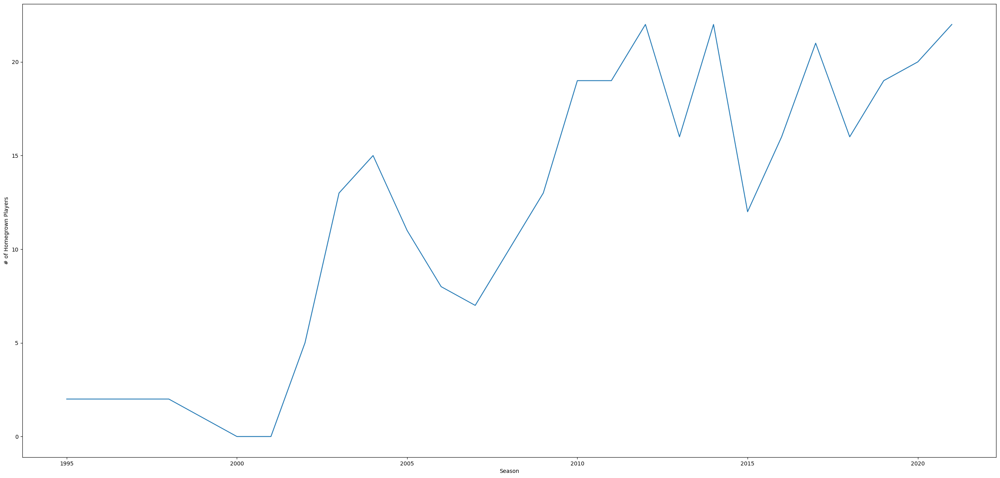

In [44]:
plt.figure(figsize=(32,15))
sns.lineplot(x='season_start_year', y='homegrown_players', data=master_df)
plt.xlabel('Season')
plt.ylabel('# of Homegrown Players')
plt.show()

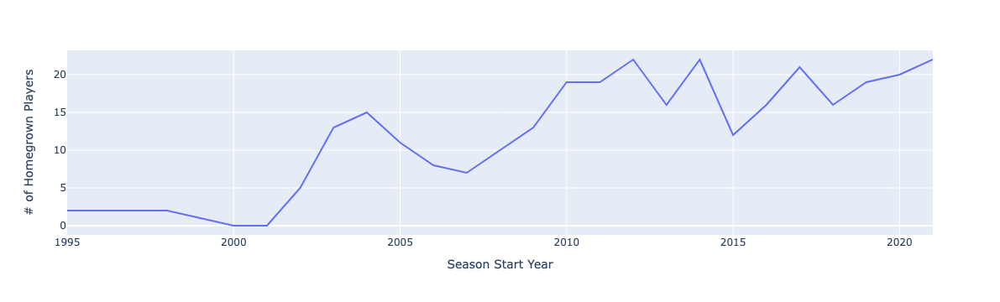

In [45]:
fig = px.line(master_df, x='season_start_year', y='homegrown_players')
fig.update_layout(xaxis_title='Season Start Year', yaxis_title='# of Homegrown Players')
fig.show()

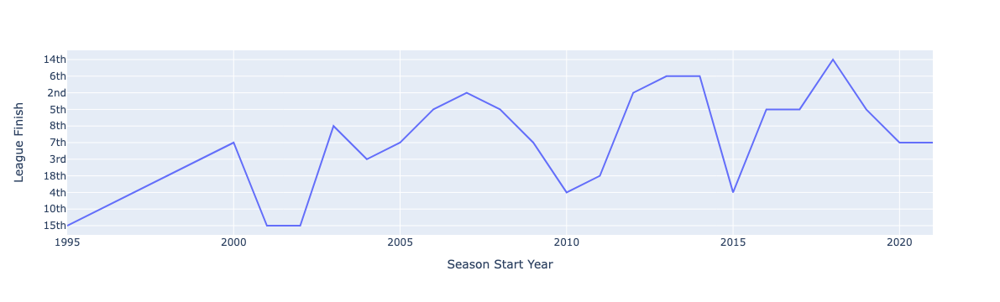

In [46]:
fig = px.line(master_df, x="season_start_year", y="league_finish")
fig.update_layout(xaxis_title='Season Start Year', yaxis_title='League Finish')
fig.show()

#y-axis still messed up 

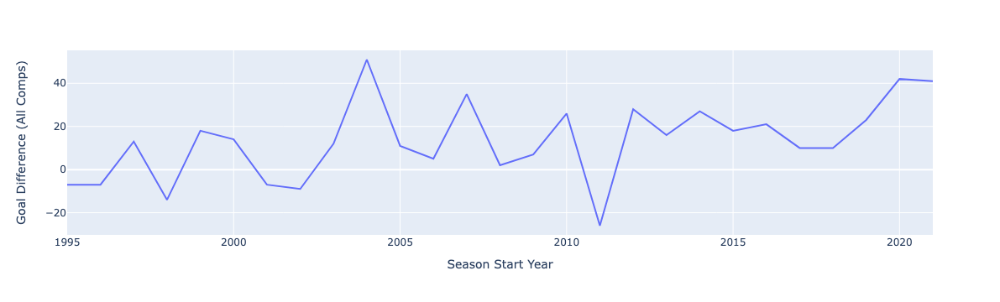

In [47]:
fig = px.line(master_df, x="season_start_year", y="goal_difference_(total)")
fig.update_layout(xaxis_title='Season Start Year', yaxis_title='Goal Difference (All Comps)')
fig.show()

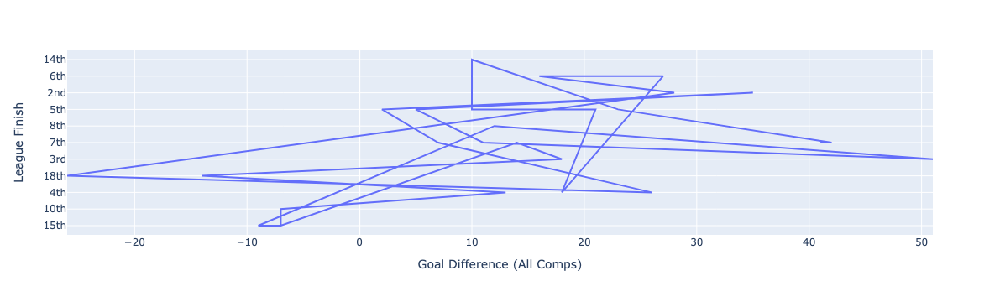

In [48]:
fig = px.line(master_df, x="goal_difference_(total)", y="league_finish")
fig.update_layout(xaxis_title='Goal Difference (All Comps)', yaxis_title='League Finish')
fig.show()

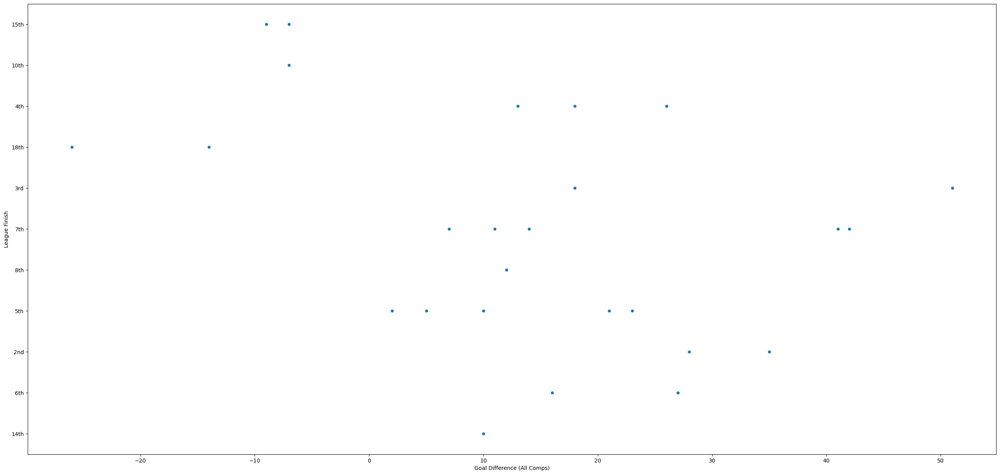

In [49]:
plt.figure(figsize=(32,15))
sns.scatterplot(x='goal_difference_(total)', y='league_finish', data=master_df)
plt.xlabel('Goal Difference (All Comps)')
plt.ylabel('League Finish')
plt.show()

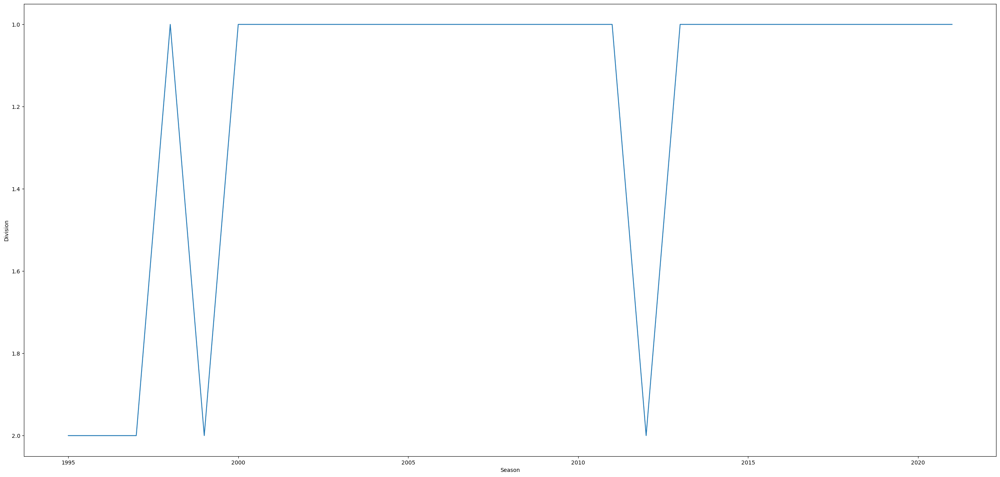

In [50]:
plt.figure(figsize=(32,15))
sns.lineplot(x='season_start_year', y='division', data=master_df)
plt.xlabel('Season')
plt.ylabel('Division')
plt.gca().invert_yaxis()
plt.show()

#MAKE DIVISION WHOLE NUMBERS, MAKES NO SENSE OTHERWISE

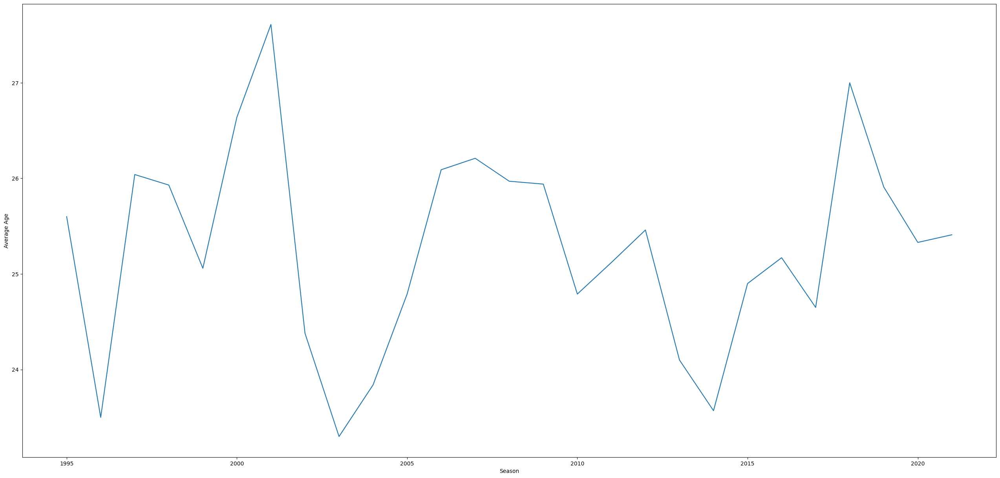

In [51]:
plt.figure(figsize=(32,15))
sns.lineplot(x='season_start_year', y='average_age', data=master_df)
plt.xlabel('Season')
plt.ylabel('Average Age')
plt.show()

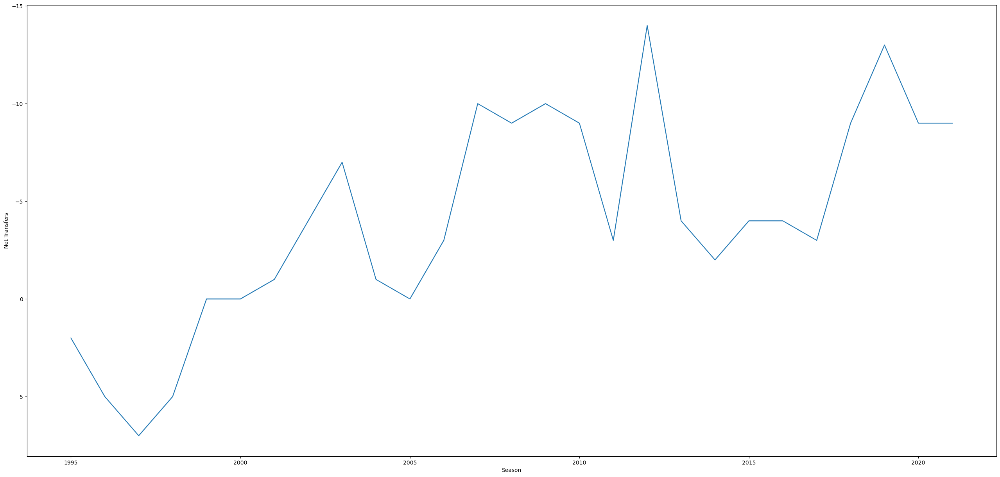

In [52]:
plt.figure(figsize=(32,15))
sns.lineplot(x='season_start_year', y='net_transfers', data=master_df)
plt.xlabel('Season')
plt.ylabel('Net Transfers')
plt.gca().invert_yaxis()
plt.show()

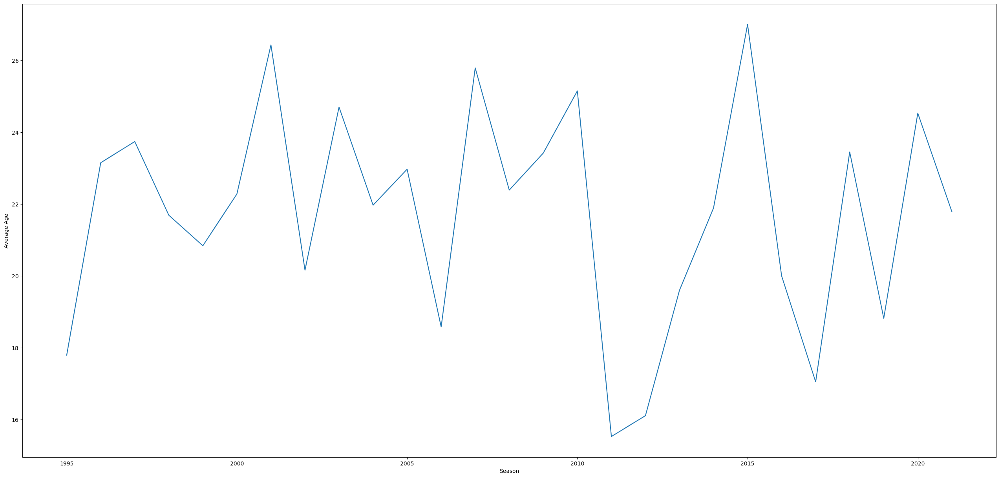

In [53]:
plt.figure(figsize=(32,15))
sns.lineplot(x='season_start_year', y='average_appearances', data=master_df)
plt.xlabel('Season')
plt.ylabel('Average Age')
plt.show()

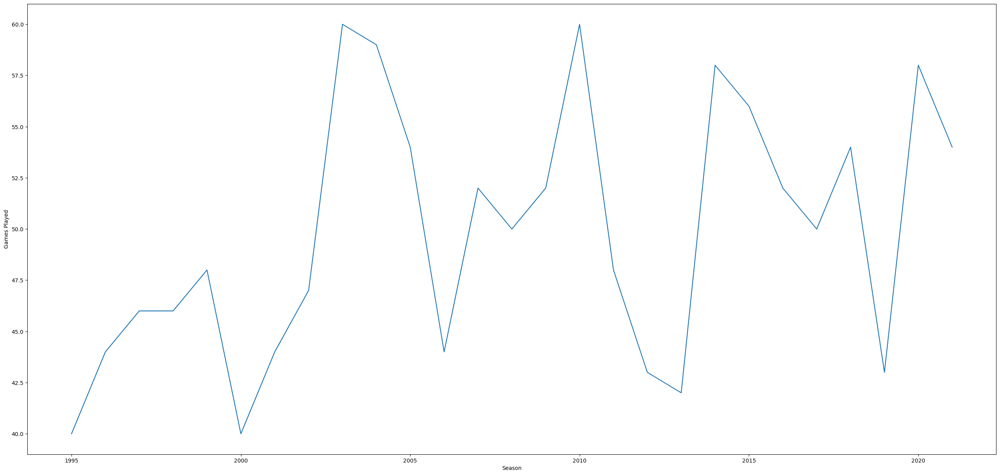

In [54]:
plt.figure(figsize=(32,15))
sns.lineplot(x='season_start_year', y='games_played_(total)', data=master_df)
plt.xlabel('Season')
plt.ylabel('Games Played')
plt.show()

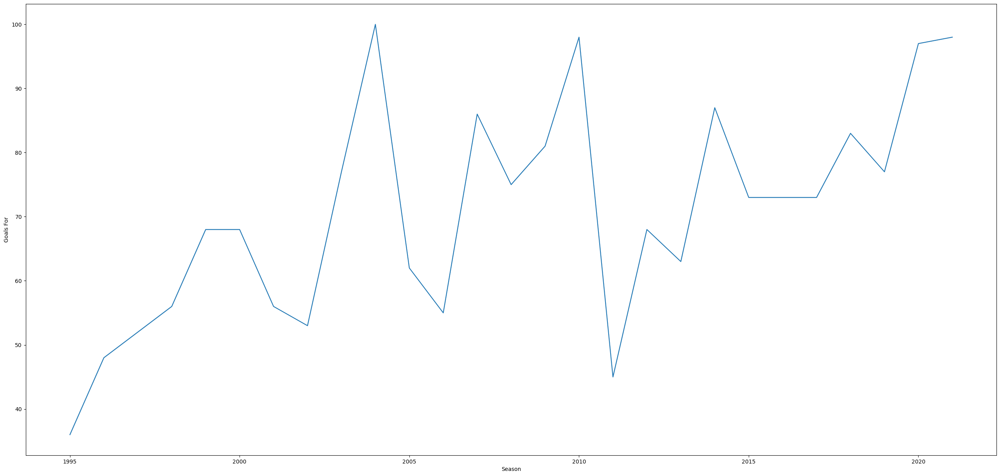

In [55]:
plt.figure(figsize=(32,15))
sns.lineplot(x='season_start_year', y='goals_for_(total)', data=master_df)
plt.xlabel('Season')
plt.ylabel('Goals For')
plt.show()

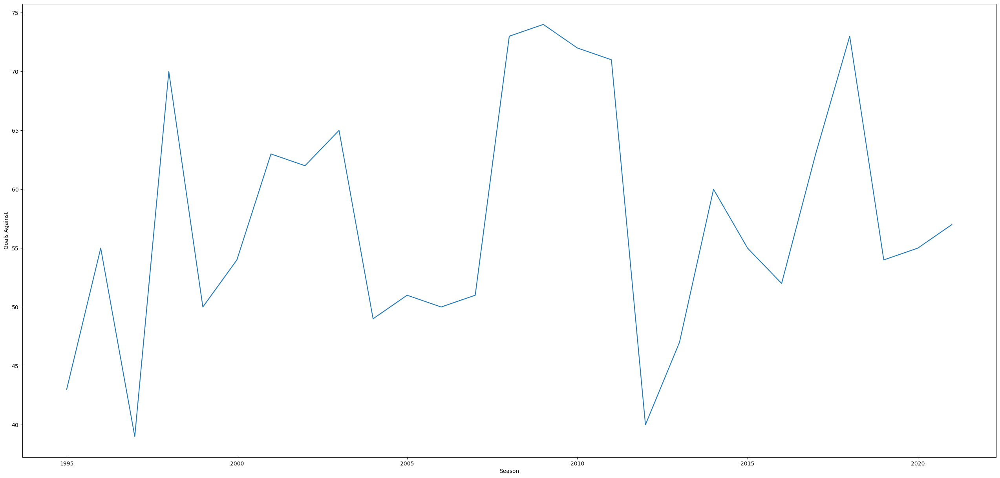

In [56]:
plt.figure(figsize=(32,15))
sns.lineplot(x='season_start_year', y='goals_against_(total)', data=master_df)
plt.xlabel('Season')
plt.ylabel('Goals Against')
plt.show()

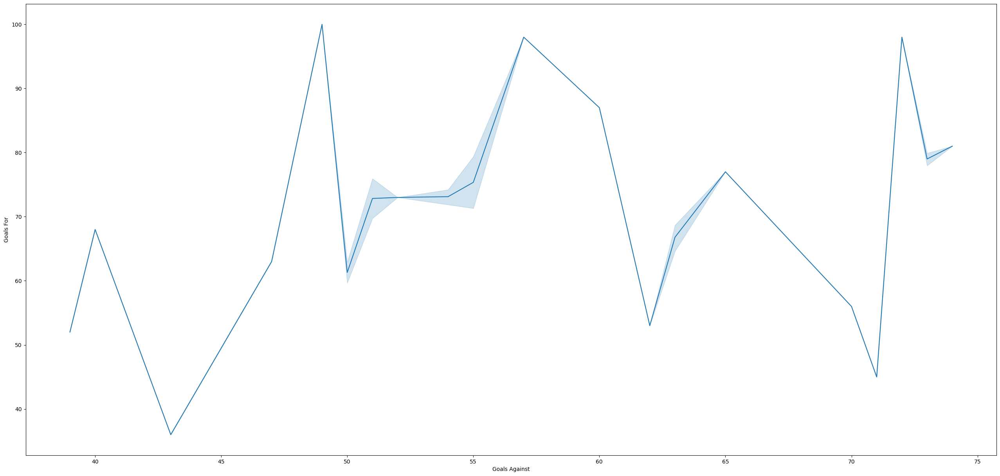

In [57]:
plt.figure(figsize=(32,15))
sns.lineplot(x='goals_against_(total)', y='goals_for_(total)', data=master_df)
plt.xlabel('Goals Against')
plt.ylabel('Goals For')
plt.show()

In [101]:
season_start_years = master_df['season_start_year'].unique()
grouped_data = master_df.groupby('season_start_year')
goals_scored_per_season = grouped_data['goals_for_(total)']

goals_scored_df = pd.DataFrame({'Season': goals_scored_per_season.index, 'Goals Scored': goals_scored_per_season.first()})

fig, ax = plt.subplots(figsize=(32, 15))
sns.barplot(x='Season', y='Goals Scored', data=goals_scored_df)
ax.set_xlabel('Season')
ax.set_ylabel('Goals Scored')
ax.set_title('Goals Scored per Season')
plt.xticks(rotation=45)
plt.show()

AttributeError: 'SeriesGroupBy' object has no attribute 'index'

In [58]:
### Examining Relationships Using Regression

In [59]:
master_df.isna().sum()

season                             0
season_start_year                  0
league                             0
division                           0
league_finish                      0
position                           0
name                               0
nationality                        0
age                                0
minutes_(total)                    0
starting_appearances_(league)      0
substitute_appearances_(league)    0
starting_appearances_(total)       0
substitute_appearances_(total)     0
total_appearances                  0
goals_(total)                      0
goals_(league)                     0
g/minutes_(total)                  0
g/appearances_(total)              0
european_competition               0
tier                               0
performance                        0
round_of_tournament                0
homegrown_players                  0
transfers_in                       0
transfers_out                      0
net_transfers                      0
g

In [60]:
master_df.dtypes

season                              object
season_start_year                    int64
league                              object
division                             int64
league_finish                       object
position                            object
name                                object
nationality                         object
age                                  int64
minutes_(total)                      int64
starting_appearances_(league)        int64
substitute_appearances_(league)      int64
starting_appearances_(total)         int64
substitute_appearances_(total)       int64
total_appearances                   object
goals_(total)                        int64
goals_(league)                       int64
g/minutes_(total)                  float64
g/appearances_(total)              float64
european_competition                object
tier                                object
performance                         object
round_of_tournament                 object
homegrown_p

In [61]:
data = pd.DataFrame(master_df.copy())

In [62]:
display(data)

,season,season_start_year,league,division,league_finish,position,name,nationality,age,minutes_(total),...,goal_difference_(total),goals_per_game_(total),games_played_(league),goals_for_(league),goals_against_(league),goal_difference_(league),goals_per_game_(league),average_age,average_appearances,average_minutes
0,1995-1996,1995,Segunda División,2,15th,GK,Luis Pascual,Spain,27,2880,...,-7,0.900000,38,32,39,-7,0.842105,25.60,17.79,1240.42
1,1995-1996,1995,Segunda División,2,15th,GK,Alejandro Revuelta,Spain,24,0,...,-7,0.900000,38,32,39,-7,0.842105,25.60,17.79,1240.42
2,1995-1996,1995,Segunda División,2,15th,GK,Juan Díez de los Ríos,Spain,19,0,...,-7,0.900000,38,32,39,-7,0.842105,25.60,17.79,1240.42
3,1995-1996,1995,Segunda División,2,15th,GK,Francisco Sánchez Broto,Spain,24,720,...,-7,0.900000,38,32,39,-7,0.842105,25.60,17.79,1240.42
4,1995-1996,1995,Segunda División,2,15th,DF,Pascual Donat,Spain,27,2563,...,-7,0.900000,38,32,39,-7,0.842105,25.60,17.79,1240.42
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
929,2021-2022,2021,La Liga,1,7th,FW,Dani Raba,Spain,26,328,...,41,1.814815,38,63,37,26,1.657895,25.41,21.79,1379.08
930,2021-2022,2021,La Liga,1,7th,FW,Yéremi Pino,Spain,19,2225,...,41,1.814815,38,63,37,26,1.657895,25.41,21.79,1379.08
931,2021-2022,2021,La Liga,1,7th,FW,Boulaye Dia,Senegal,25,1653,...,41,1.814815,38,63,37,26,1.657895,25.41,21.79,1379.08
932,2021-2022,2021,La Liga,1,7th,FW,Samu Chukwueze,Nigeria,22,1766,...,41,1.814815,38,63,37,26,1.657895,25.41,21.79,1379.08


In [110]:
data['nationality'].nunique()

37

In [63]:
data['tier']

0      DNQ
1      DNQ
2      DNQ
3      DNQ
4      DNQ
      ... 
929      1
930      1
931      1
932      1
933      1
Name: tier, Length: 934, dtype: object

In [65]:
data['tier'] = pd.to_numeric(data['tier'], errors='coerce')

In [66]:
data['tier'].dtype

dtype('float64')

In [102]:
numericals = data.select_dtypes(include=[np.number])
categoricals = data.select_dtypes(exclude=[np.number])

In [106]:
display(numericals)

,season_start_year,division,age,minutes_(total),starting_appearances_(league),substitute_appearances_(league),starting_appearances_(total),substitute_appearances_(total),goals_(total),goals_(league),g/minutes_(total),g/appearances_(total),tier,homegrown_players,transfers_in,transfers_out,net_transfers,games_played_(total),goals_for_(total),goals_against_(total),goal_difference_(total),goals_per_game_(total),games_played_(league),goals_for_(league),goals_against_(league),goal_difference_(league),goals_per_game_(league),average_age,average_appearances,average_minutes
0,1995,2,27,2880,31,0,32,0,0,0,0.000000,0.000000,NaN,2,6,4,2.0,40,36,43,-7,0.900000,38,32,39,-7,0.842105,25.60,17.79,1240.42
1,1995,2,24,0,0,0,0,0,0,0,0.000000,0.000000,NaN,2,6,4,2.0,40,36,43,-7,0.900000,38,32,39,-7,0.842105,25.60,17.79,1240.42
2,1995,2,19,0,0,0,0,0,0,0,0.000000,0.000000,NaN,2,6,4,2.0,40,36,43,-7,0.900000,38,32,39,-7,0.842105,25.60,17.79,1240.42
3,1995,2,24,720,7,0,8,0,0,0,0.000000,0.000000,NaN,2,6,4,2.0,40,36,43,-7,0.900000,38,32,39,-7,0.842105,25.60,17.79,1240.42
4,1995,2,27,2563,30,1,31,2,1,1,2563.000000,33.000000,NaN,2,6,4,2.0,40,36,43,-7,0.900000,38,32,39,-7,0.842105,25.60,17.79,1240.42
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
929,2021,1,26,328,0,7,3,9,1,0,328.000000,12.000000,1.0,22,7,16,-9.0,54,98,57,41,1.814815,38,63,37,26,1.657895,25.41,21.79,1379.08
930,2021,1,19,2225,21,10,28,12,7,6,317.857143,5.714286,1.0,22,7,16,-9.0,54,98,57,41,1.814815,38,63,37,26,1.657895,25.41,21.79,1379.08
931,2021,1,25,1653,13,12,17,18,7,5,236.142857,5.000000,1.0,22,7,16,-9.0,54,98,57,41,1.814815,38,63,37,26,1.657895,25.41,21.79,1379.08
932,2021,1,22,1766,12,15,16,22,7,3,252.285714,5.428571,1.0,22,7,16,-9.0,54,98,57,41,1.814815,38,63,37,26,1.657895,25.41,21.79,1379.08


In [ ]:
numericals.fillna("")

In [104]:
numericals.columns

Index(['season_start_year', 'division', 'age', 'minutes_(total)',
       'starting_appearances_(league)', 'substitute_appearances_(league)',
       'starting_appearances_(total)', 'substitute_appearances_(total)',
       'goals_(total)', 'goals_(league)', 'g/minutes_(total)',
       'g/appearances_(total)', 'tier', 'homegrown_players', 'transfers_in',
       'transfers_out', 'net_transfers', 'games_played_(total)',
       'goals_for_(total)', 'goals_against_(total)', 'goal_difference_(total)',
       'goals_per_game_(total)', 'games_played_(league)', 'goals_for_(league)',
       'goals_against_(league)', 'goal_difference_(league)',
       'goals_per_game_(league)', 'average_age', 'average_appearances',
       'average_minutes'],
      dtype='object')

In [69]:
sns.pairplot(numericals)
plt.show()

/var/folders/zh/vb5lf3750v95681z25hzkm9c0000gn/T/ipykernel_8052/2556753048.py:2: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



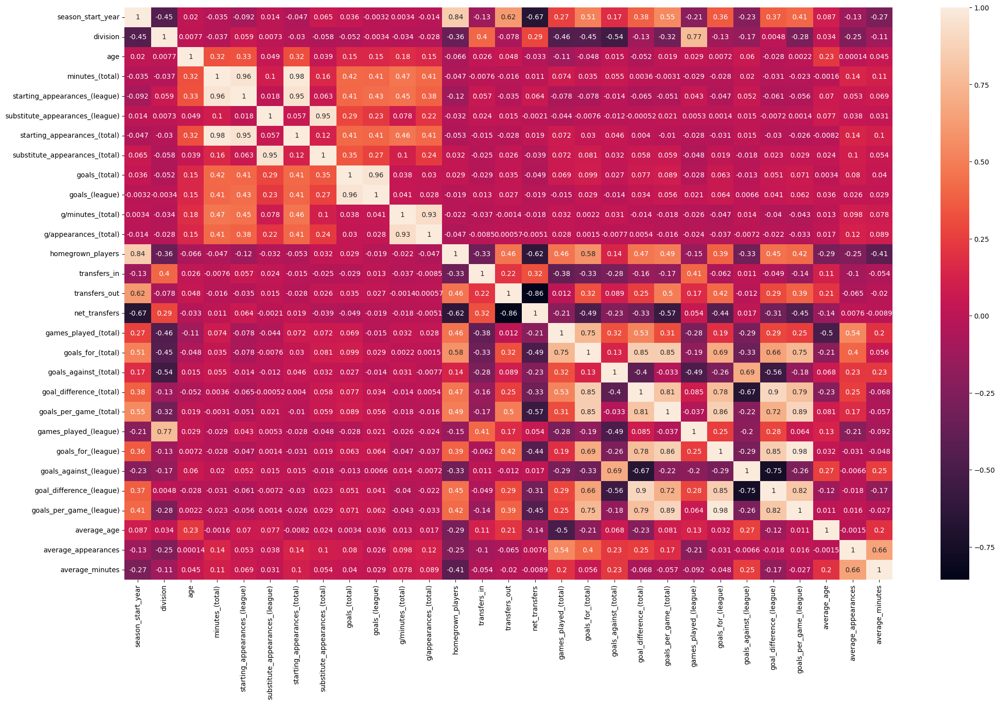

In [73]:
plt.figure(figsize=(25,15))
corr = master_df.corr()
sns.heatmap(corr, annot=True)
plt.show()

In [ ]:
### Checking Relationships for Homegrown Players

Text(0.5, 1.0, 'Checking relationships')

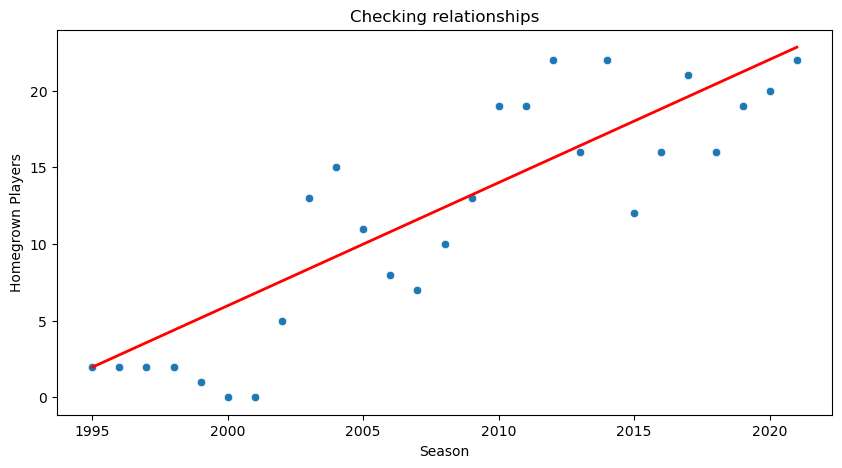

In [108]:
fig, ax = plt.subplots(figsize=(10,5))
sns.scatterplot(data = data, y='homegrown_players', x='season_start_year')

x = data['season_start_year']
y = data['homegrown_players']

slope, intercept = np.polyfit(x, y, 1)

reg_x = np.array([min(x), max(x)])
reg_y = slope * reg_x + intercept

ax.plot(reg_x,reg_y,color='red', linestyle='-', linewidth=2)

ax.set_xlabel('Season')
ax.set_ylabel('Homegrown Players')
ax.set_title('Checking relationships')

Text(0.5, 1.0, 'Checking relationships')

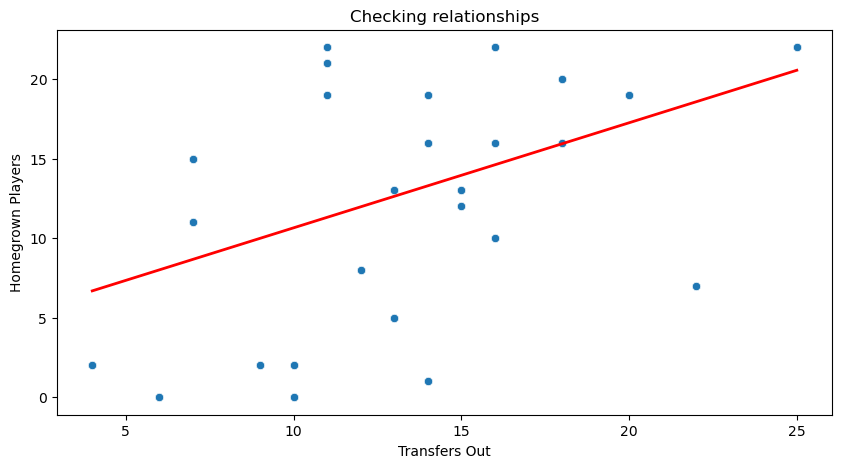

In [92]:
fig, ax = plt.subplots(figsize=(10,5))
sns.scatterplot(data = data, y='homegrown_players', x='transfers_out')

x = data['transfers_out']
y = data['homegrown_players']

slope, intercept = np.polyfit(x, y, 1)

reg_x = np.array([min(x), max(x)])
reg_y = slope * reg_x + intercept

ax.plot(reg_x,reg_y,color='red', linestyle='-', linewidth=2)

ax.set_xlabel('Transfers Out')
ax.set_ylabel('Homegrown Players')
ax.set_title('Checking relationships')

Text(0.5, 1.0, 'Checking relationships')

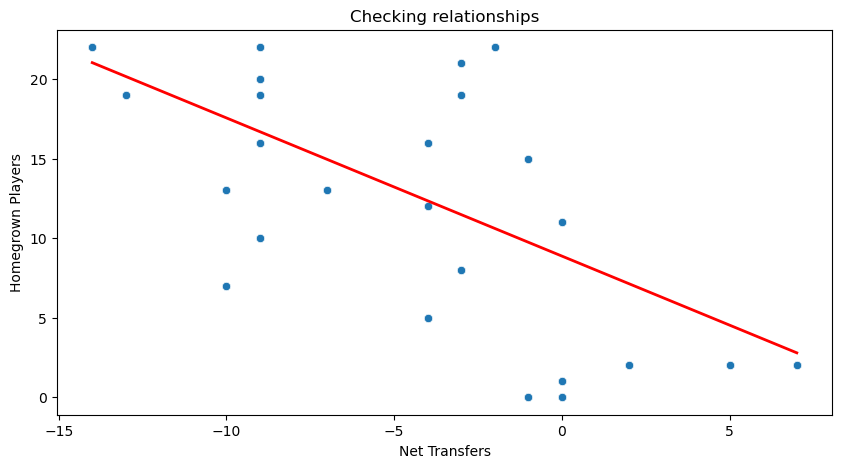

In [91]:
fig, ax = plt.subplots(figsize=(10,5))
sns.scatterplot(data = data, y='homegrown_players', x='net_transfers')

x = data['net_transfers']
y = data['homegrown_players']

slope, intercept = np.polyfit(x, y, 1)

reg_x = np.array([min(x), max(x)])
reg_y = slope * reg_x + intercept

ax.plot(reg_x,reg_y,color='red', linestyle='-', linewidth=2)

ax.set_xlabel('Net Transfers')
ax.set_ylabel('Homegrown Players')
ax.set_title('Checking relationships')

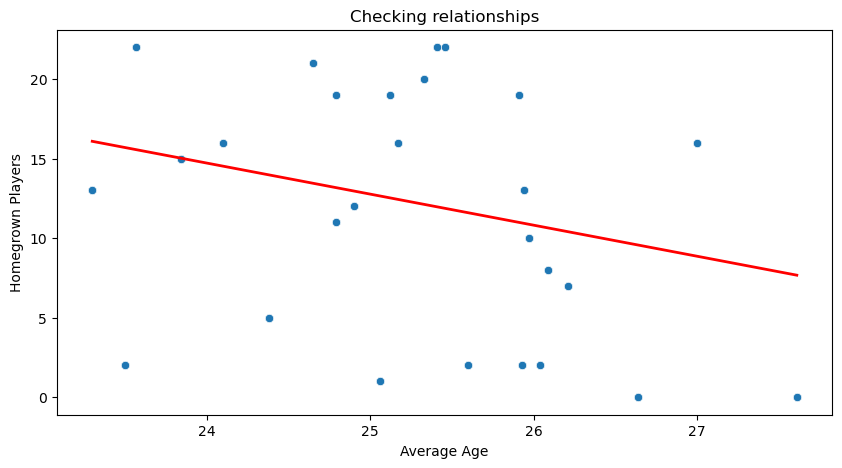

In [117]:
fig, ax = plt.subplots(figsize=(10,5))
sns.scatterplot(data = data, y='homegrown_players', x='average_age')

x = data['average_age']
y = data['homegrown_players']

slope, intercept = np.polyfit(x, y, 1)

reg_x = np.array([min(x), max(x)])
reg_y = slope * reg_x + intercept

ax.plot(reg_x,reg_y,color='red', linestyle='-', linewidth=2)

ax.set_xlabel('Average Age')
ax.set_ylabel('Homegrown Players')
ax.set_title('Checking relationships')
plt.savefig("../img/age_to_homegrown.png", dpi=300)
plt.show()

Text(0.5, 1.0, 'Checking relationships')

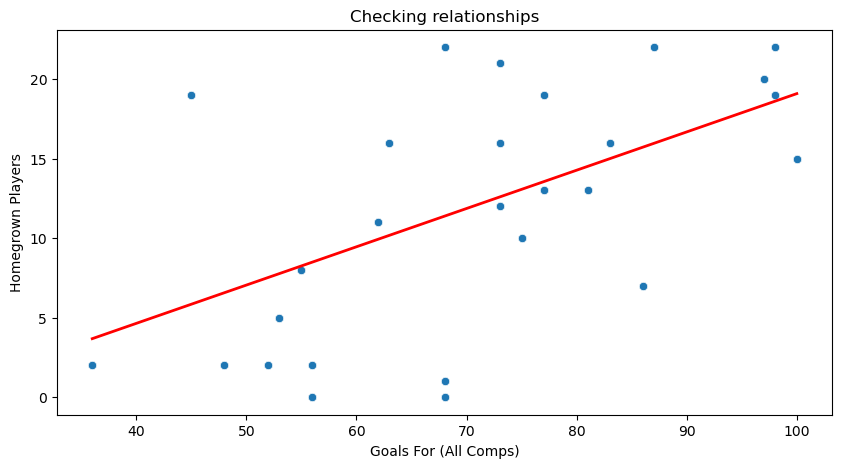

In [88]:
fig, ax = plt.subplots(figsize=(10,5))
sns.scatterplot(data = data, y='homegrown_players', x='goals_for_(total)')

x = data['goals_for_(total)']
y = data['homegrown_players']

slope, intercept = np.polyfit(x, y, 1)

reg_x = np.array([min(x), max(x)])
reg_y = slope * reg_x + intercept

ax.plot(reg_x,reg_y,color='red', linestyle='-', linewidth=2)

ax.set_xlabel('Goals For (All Comps)')
ax.set_ylabel('Homegrown Players')
ax.set_title('Checking relationships')

Store cleaned data

In [119]:
master_df.to_csv("../Data/Clean/data_cleaned.csv", index=False)